# Fine Tuning for fundus image classification

Trains a CNN model for image classificaiton (Disease, NotDisease)

## 数据准备

只需要运行一次

------------------------

    Date: April, 2021

    N: Normal. 500
    Y: ROP. 500. Include: Stage 1: 106. Stage 2: 167. Stage 3: 150. Stage 4: 77.
    
    Saved to '../data/fundus/C2/C2_202104.pkl'
 ------------------------   
    
    Date: August, 2021

    N: Normal. 1000
    Y: Stage 1: 216. Stage 2: 663. Stage 3: 846. Stage 4: 77.
    
    Saved to '../data/fundus/C5/C5_202108.pkl'
    
    In this study, we combine Stage1 & Stage2, Stage3 & Stage4

In [1]:
from tlearner.efficientnet import transfer_learner
learner = transfer_learner("fundus_C3_customEfficientNetB4_model", W = 224)

## 数据读取，并保存到pkl（只需要运行一次）

## 从pkl直接数据读取，读取训练集、验证集、类标签等

In [2]:
learner.load_dataset_from_pkl(PKL_PATH = "fundus_efficientnet_dataset.pkl")

## C5 -> C3

In [4]:
import math
from tensorflow.python.keras.utils.np_utils import to_categorical

learner.class_names = ['Normal', 'Stage1~2', 'Stage3~4']
learner.num_classes = len(learner.class_names)

def combine_class(c):
    return math.ceil(c/2.0)

y_train_c = list(map(combine_class, learner.y_train.argmax(-1)))
# convert class labels to on-hot encoding
learner.y_train = to_categorical(y_train_c, learner.num_classes)

y_val_c = list(map(combine_class, learner.y_val.argmax(-1)))
# convert class labels to on-hot encoding
learner.y_val = to_categorical(y_val_c, learner.num_classes)

In [4]:
hist = learner.train("EfficientNetB4", 
    batch = 12, epochs = [20,10], optimizer = "adam")

Epoch 1/20
154/154 [==============================] - 163s 1s/step - loss: 0.7865 - accuracy: 0.6784 - val_loss: 0.5445 - val_accuracy: 0.7549
Epoch 2/20
154/154 [==============================] - 159s 1s/step - loss: 0.5858 - accuracy: 0.7549 - val_loss: 0.5057 - val_accuracy: 0.7787
Epoch 3/20
154/154 [==============================] - 150s 973ms/step - loss: 0.5120 - accuracy: 0.7977 - val_loss: 0.5234 - val_accuracy: 0.7766
Epoch 4/20
154/154 [==============================] - 161s 1s/step - loss: 0.4726 - accuracy: 0.8107 - val_loss: 0.4743 - val_accuracy: 0.7961
Epoch 5/20
154/154 [==============================] - 155s 1s/step - loss: 0.4421 - accuracy: 0.8200 - val_loss: 0.4212 - val_accuracy: 0.8330
Epoch 6/20
154/154 [==============================] - 151s 979ms/step - loss: 0.3898 - accuracy: 0.8476 - val_loss: 0.4637 - val_accuracy: 0.8091
Epoch 7/20
154/154 [==============================] - 155s 1s/step - loss: 0.3714 - accuracy: 0.8530 - val_loss: 0.4263 - val_accuracy: 

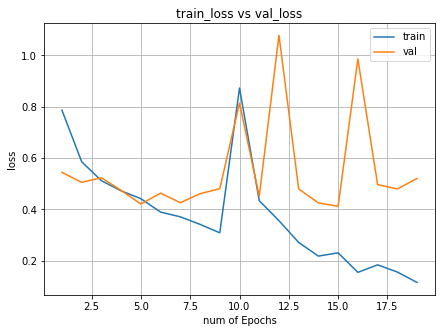

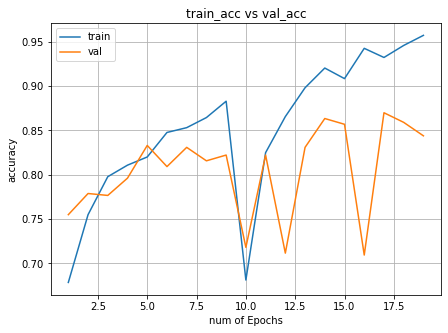

In [11]:
from tlearner.efficientnet import plot_two_stage_hist
plot_two_stage_hist(hist[0], hist[1])

## Continue Training

If the model doesn't reach the best, continue training

# get the best model

In [12]:
learner.get_best_model().summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
rescaling (Rescaling)           (None, 224, 224, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
normalization (Normalization)   (None, 224, 224, 3)  7           rescaling[0][0]                  
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 225, 225, 3)  0           normalization[0][0]              
_______________________________________________________________________________________

## Test on validation set

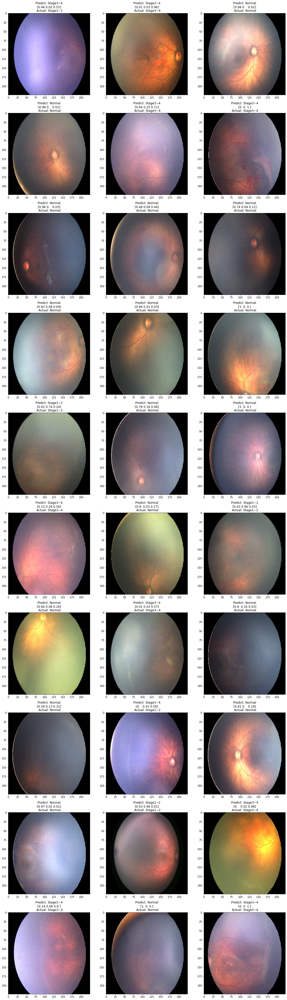

In [5]:
learner.evaluate(N = 30) # batch_size 10

# Binary Classification Test

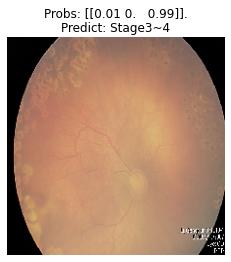

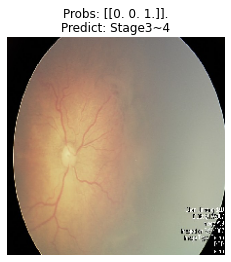

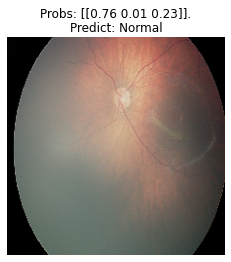

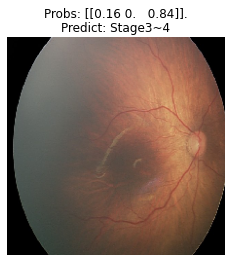

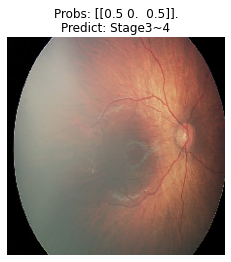

...

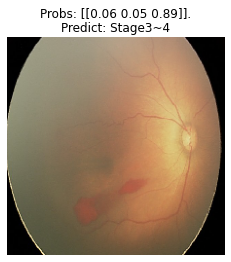

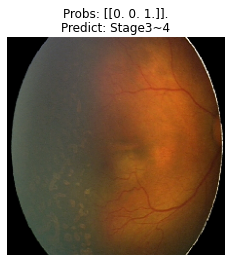

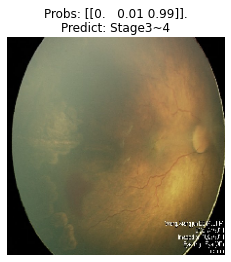

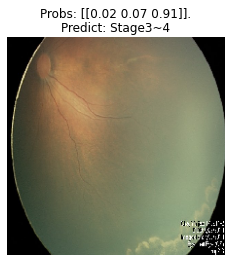

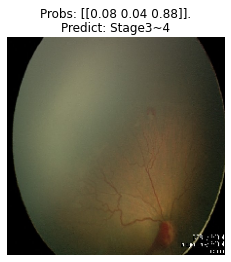

Averaged prob on disease set = 0.6666667


In [14]:
DIR = '../../../data/fundus/C5/Disease/'  # dont't use ../data/fundus/C2T/Y/, which is included in the training set. Now is deleted

ps = []
for idx, img in enumerate(os.listdir(DIR)):
    img_path = DIR + '/'+ img        

    p = learner.predict_file(img_path, display = idx < 20, use_mask = True) # 只显示前N个数据
    ps.append(1 - p[0])
    
print('Averaged prob on disease set =', np.mean(ps))

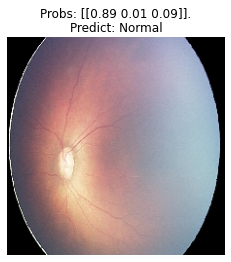

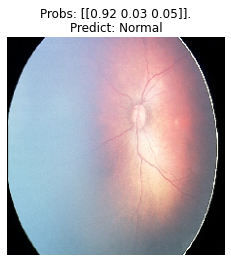

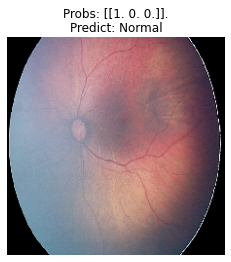

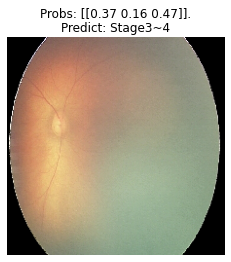

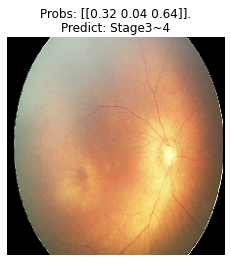

...

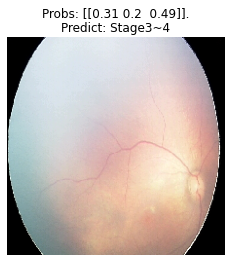

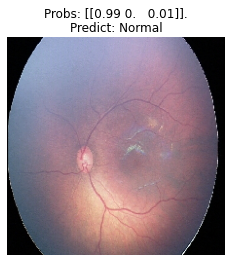

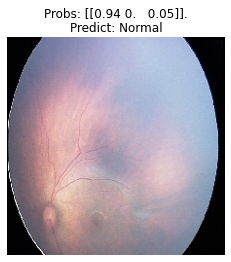

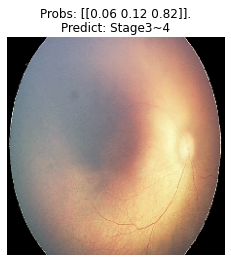

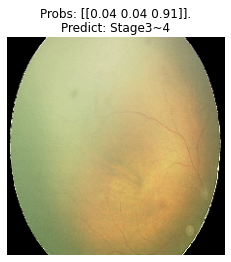

Averaged prob on normal set = 0.33333334


In [16]:
DIR = '../../../data/fundus/C5/NotDisease/' # dont't use ../data/fundus/C2T/N/, which is included in the training set. Now is deleted

ps = []
for idx, img in enumerate(os.listdir(DIR)):
    img_path = DIR + '/'+ img        

    # p = predict(custom_vgg_model, img_path, names, display = idx < 10) # 只显示前10个数据
    p = learner.predict_file(img_path, display = idx < 20, use_mask = True) # 只显示前N个数据
    ps.append(p[0]) # 0 - Normal
    
print('Averaged prob on normal set =', np.mean(ps))

# Convert to tflite

In [3]:
learner.convert_to_tflite(v1 = True)

Instructions for updating:
Simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: C:\Users\eleve\AppData\Local\Temp\tmp5eqsbw65\assets
Instructions for updating:
This function will only be available through the v1 compatibility library as tf.compat.v1.saved_model.loader.load or tf.compat.v1.saved_model.load. There will be a new function for importing SavedModels in Tensorflow 2.0.
INFO:tensorflow:Restoring parameters from C:\Users\eleve\AppData\Local\Temp\tmp5eqsbw65\variables\variables
INFO:tensorflow:The given SavedModel MetaGraphDef contains SignatureDefs with the following keys: {'serving_default', '__saved_model_init_op'}
INFO:tensorflow:input tensors info: 
INFO:te

'fundus_C3_customEfficientNetB4_model.tflite'

In [6]:
%run transfer_learner.py

convert_keras_to_tflite("fundus_C3_customEfficientNetB4_model_best2.hdf5",
                        "fundus_C3_customEfficientNetB4_model_best2.tflite",
                        v1=True)

INFO:tensorflow:Assets written to: C:\Users\eleve\AppData\Local\Temp\tmpsymohqob\assets


INFO:tensorflow:Assets written to: C:\Users\eleve\AppData\Local\Temp\tmpsymohqob\assets


INFO:tensorflow:Restoring parameters from C:\Users\eleve\AppData\Local\Temp\tmpsymohqob\variables\variables


INFO:tensorflow:Restoring parameters from C:\Users\eleve\AppData\Local\Temp\tmpsymohqob\variables\variables


INFO:tensorflow:The given SavedModel MetaGraphDef contains SignatureDefs with the following keys: {'serving_default', '__saved_model_init_op'}


INFO:tensorflow:The given SavedModel MetaGraphDef contains SignatureDefs with the following keys: {'serving_default', '__saved_model_init_op'}


INFO:tensorflow:input tensors info: 


INFO:tensorflow:input tensors info: 


INFO:tensorflow:Tensor's key in saved_model's tensor_map: input_1


INFO:tensorflow:Tensor's key in saved_model's tensor_map: input_1


INFO:tensorflow: tensor name: serving_default_input_1:0, shape: (-1, 224, 224, 3), type: DT_FLOAT


INFO:tensorflow: tensor name: serving_default_input_1:0, shape: (-1, 224, 224, 3), type: DT_FLOAT


INFO:tensorflow:output tensors info: 


INFO:tensorflow:output tensors info: 


INFO:tensorflow:Tensor's key in saved_model's tensor_map: output


INFO:tensorflow:Tensor's key in saved_model's tensor_map: output


INFO:tensorflow: tensor name: StatefulPartitionedCall:0, shape: (-1, 3), type: DT_FLOAT


INFO:tensorflow: tensor name: StatefulPartitionedCall:0, shape: (-1, 3), type: DT_FLOAT


INFO:tensorflow:Restoring parameters from C:\Users\eleve\AppData\Local\Temp\tmpsymohqob\variables\variables


INFO:tensorflow:Restoring parameters from C:\Users\eleve\AppData\Local\Temp\tmpsymohqob\variables\variables


tflite model saved to: fundus_C3_customEfficientNetB4_model_best2.tflite
